In [5]:
import argparse
import copy
from dataclasses import dataclass
from datetime import datetime, timedelta
import math
import os
from pathlib import Path

import matplotlib.pyplot as plt
import numpy as np
import rasterio as rs
import torch
import torch.nn as nn
import torch.nn.functional as F
from accelerate import Accelerator
from datasets import load_dataset
from diffusers import UNet3DConditionModel
from diffusers.optimization import get_cosine_schedule_with_warmup
from huggingface_hub import HfFolder, Repository, whoami
from PIL import Image
from torch.utils.data import DataLoader, Dataset
from torchvision import transforms
from tqdm.auto import tqdm

from dataset_loader_simple import CogDataset

# Define argument parser
parser = argparse.ArgumentParser()

# Define arguments
parser.add_argument("--runname", type=str, default="v1_Cond3Du8", help="The model name on the HF Hub")
# v1_Cond3Du7: dynamic vmax
# v1_Cond3Du7: add noise_var
# v1_Cond3Du7: add CloudMaskDilation
# v1_Cond3Du8: add CloudShadownScale
parser.add_argument("--image_size", type=int, default=224, help="The generated image resolution")
parser.add_argument("--train_bs", type=int, default=1, help="The training batch size")
parser.add_argument("--eval_bs", type=int, default=2, help="The evaluation batch size")
parser.add_argument("--num_epochs", type=int, default=10, help="The number of training epochs")
parser.add_argument("--grad_accm", type=int, default=1, help="The number of gradient accumulation steps")
parser.add_argument("--lr", type=float, default=1e-4, help="The learning rate")
parser.add_argument("--model_blocks", type=str, default="CCCCA", help="The model blocks")
parser.add_argument("--block_type", type=str, default="conv", help="The model blocks", choices=["conv", "resnet"])
parser.add_argument("--sample_reuse", type=int, default=3, help="reusing current batch", choices=[1, 2, 3])
parser.add_argument("--in_channel", type=int, default=3, help="number of input channel")


# Experimental Features
parser.add_argument("--cld_mask_loss", type=int, default=1, help="Whether to use cloud noise | if yes, then it indicates scale")
parser.add_argument("--cld_sc", type=int, default=10, help="The scale of cloud mask")
parser.add_argument("--time_span", type=int, default=3, help="The number of frame")
parser.add_argument("--vmax", type=float, default=0.3, help="maximum value")
parser.add_argument("--mask_scale", type=int, default=32, help="The scale of mask")
parser.add_argument("--mask_thres", type=float, default=0.1, help="The threshold of mask")
parser.add_argument("--dynamic_vmax", type=int, default=0, help="0 for static vmax, 1 for dynamic vmax")
parser.add_argument("--noise_var", type=float, default=0.05, help="The variance of noise")
parser.add_argument("--CloudMaskDilation", type=int, default=3, help="The variance of noise")
parser.add_argument("--CloudShadownScale", type=float, default=0.5, help="The variance of noise")

# Reproducibility
parser.add_argument("--seed", type=int, default=0, help="The random seed")
parser.add_argument("--wandb", type=int, default=1, help="0 for no wandb, 1 for wandb")
parser.add_argument("--push_to_hub", type=int, default=0, help="0 for no push to hub, 1 for push to hub")
parser.add_argument("--mode", type=str, default="test", help="train or test")
parser.add_argument("--vis_freq", type=int, default=50, help="train or test")

# Parse arguments
args, _ = parser.parse_known_args()

# Print arguments
print("Arguments:", args)


args.runname += f"_0411_I{args.time_span*3}O{args.time_span*3}-Blc{args.model_blocks}-SmpU{args.sample_reuse}"
args.runname += f"-MskSc{args.mask_scale}MskTh{args.mask_thres}"
args.runname += f"-DyVmax{args.dynamic_vmax}-NVar{args.noise_var}-CldDil{args.CloudMaskDilation}-CldShd{args.CloudShadownScale}"
args.runname += f"-Seed{args.seed}"
args.runname = args.runname.replace(".", "").replace("-", "_")
args.output_dir = "./results/" + args.runname

if args.mode == "test":
    args.push_to_hub = 0
    args.wandb = 0
    num_workers = 0
    args.vis_freq = 1
else:
    num_workers = 2

# Set up the dataset and dataloader
train_rois = ["roi"+str(i) for i in range(20)]  # List of ROIs
val_rois = ["roi"+str(i) for i in range(40, 45)]  # List of ROIs
start_date = datetime(2021, 9, 1)
end_date = datetime(2022, 12, 31)
time_span = 7  # Time span of 14 days
train_dataset = CogDataset(train_rois, start_date, end_date, time_span, num_images=args.time_span)
train_dataloader = DataLoader(train_dataset, batch_size=args.train_bs * args.sample_reuse, shuffle=True, num_workers=num_workers, pin_memory=True, drop_last=True)
val_dataset = CogDataset(val_rois, start_date, end_date, time_span, num_images=args.time_span)
val_dataloader = DataLoader(val_dataset, batch_size=args.eval_bs, shuffle=False, num_workers=num_workers, pin_memory=True, drop_last=True)


down_block_dict = {"C": "DownBlock3D", "A": "CrossAttnDownBlock3D"}
up_block_dict = {"C": "UpBlock3D", "A": "CrossAttnUpBlock3D"}
down_block_list = [down_block_dict[b] for b in args.model_blocks]
up_block_list = [up_block_dict[b] for b in args.model_blocks][::-1]

# Set up the model
model = UNet3DConditionModel(
    sample_size=args.image_size,  # the target image resolution
    in_channels=args.time_span,  # the number of input channels, 3 for RGB images
    out_channels=args.time_span,  # the number of output channels
    layers_per_block=2,  # how many ResNet layers to use per UNet block
    block_out_channels=(64, 128, 256, 256, 512, 512, 512)[:len(args.model_blocks)],  # the number of output channels for each UNet block
    down_block_types=down_block_list,  # the down block sequence
    up_block_types=up_block_list,  # the up block sequence
)
optimizer = torch.optim.AdamW(model.parameters(), lr=args.lr, betas=(0.9, 0.95))
lr_scheduler = get_cosine_schedule_with_warmup(
    optimizer=optimizer,
    num_warmup_steps=512 / args.train_bs  * args.sample_reuse,
    num_training_steps=(len(train_dataloader) * args.num_epochs * args.sample_reuse),
)

# Set up the accelerator
def get_full_repo_name(model_id: str, organization: str = None, token: str = None):
    if token is None:
        token = HfFolder.get_token()
    if organization is None:
        username = whoami(token)["name"]
        return f"{username}/{model_id}"
    else:
        return f"{organization}/{model_id}"


accelerator = Accelerator(
    mixed_precision="fp16",
    gradient_accumulation_steps=args.grad_accm,
    log_with="wandb" if args.wandb else "tensorboard",
    project_dir=os.path.join(args.output_dir, "logs"),
)
accelerator.init_trackers(
    project_name="NoCloud-UNet", 
    config={"model": model.__class__.__name__,},
    init_kwargs={"wandb": {"entity": "cornell-kao", 
                           "name":args.runname, 
                           "config": args,
                           }}
    )
if accelerator.is_main_process:
    if args.push_to_hub:
        repo_name = get_full_repo_name(Path(args.output_dir).name)
        repo = Repository(args.output_dir, clone_from=repo_name)
    elif args.output_dir is not None:
        os.makedirs(args.output_dir, exist_ok=True)
    accelerator.init_trackers("train_example")

# Prepare everything
model, optimizer, lr_scheduler, train_dataloader, val_dataloader = accelerator.prepare(
    model, optimizer, lr_scheduler, train_dataloader, val_dataloader
)

for val_imgs, val_clouds in val_dataloader: break
val_imgs, val_clouds = val_imgs.to(model.device), val_clouds.to(model.device)






def visualize_batch(args, X, Y, C1, Z, W, C2, mode="train"):
    
    X = X * 0.5 + 0.5
    Y = Y * 0.5 + 0.5
    Z = Z * 0.5 + 0.5
    W = W * 0.5 + 0.5
    
    X = torch.clamp(X.permute(0,2,1,3,4).cpu(), 0, 1)
    Y = torch.clamp(Y.permute(0,2,1,3,4).cpu(), 0, 1)
    Z = torch.clamp(Z.permute(0,2,1,3,4).cpu(), 0, 1)
    W = torch.clamp(W.permute(0,2,1,3,4).cpu(), 0, 1)
    C1 = torch.clamp(C1.permute(0,2,1,3,4).cpu(), 0, 1)
    C2 = torch.clamp(C2.permute(0,2,1,3,4).cpu(), 0, 1)
    Bs, Time, Channel, _, _ = X.shape
    
    for batch_idx in range(args.train_bs):

        fig, axes = plt.subplots(nrows=Time, ncols=6, figsize=(10, Time * 2))

        for t in range(Time):
            # Plot X image
            axes[t, 0].imshow(X[batch_idx, t].permute(1, 2, 0).flip(dims=[2]))
            axes[t, 0].set_title(f"Input")
            # axes[t, 0].axis("off")

            # Plot Y image
            axes[t, 1].imshow(Y[batch_idx, t].permute(1, 2, 0).flip(dims=[2]))
            axes[t, 1].set_title(f"Pred")
            # axes[t, 1].axis("off")

            # Plot C1 image
            axes[t, 2].imshow(C1[batch_idx, t].permute(1, 2, 0))
            axes[t, 2].set_title(f"Cloud")
            # axes[t, 2].axis("off")

            # Plot Z image
            axes[t, 3].imshow(Z[batch_idx, t].permute(1, 2, 0).flip(dims=[2]))
            axes[t, 3].set_title(f"Input + Cloud2")
            # axes[t, 3].axis("off")

            # Plot W image
            axes[t, 4].imshow(W[batch_idx, t].permute(1, 2, 0).flip(dims=[2]))
            axes[t, 4].set_title(f"Pred")
            # axes[t, 4].axis("off")

            # Plot C2 image
            axes[t, 5].imshow(C2[batch_idx, t].permute(1, 2, 0))
            axes[t, 5].set_title(f"Cloud2")
            # axes[t, 5].axis("off")

        for ax in axes.flatten():
            ax.set_xticks([])
            ax.set_yticks([])

        for t in range(Time):
            axes[t, 0].set_ylabel(f"t = {t+1}")

        plt.tight_layout()
        plt.savefig(os.path.join(args.output_dir, f"{mode}_EP{args.epoch}_S{args.step}_B{batch_idx}_Smp{args.sample_id}.png"))
        plt.pause(0.3)
        plt.close()

def random_flip(imgs, clouds=None):
    
    if torch.rand(1) < 0.5:  # Flip along time domain
        imgs = torch.flip(imgs, [2])
        if clouds is not None: clouds = torch.flip(clouds, [2])
    
    if torch.rand(1) < 0.5:  # Generate random boolean indices for flipping
        imgs = torch.flip(imgs, [3])
        if clouds is not None: clouds = torch.flip(clouds, [3])
    
    if torch.rand(1) < 0.5:  # Generate random boolean indices for flipping
        imgs = torch.flip(imgs, [4])
        if clouds is not None: clouds = torch.flip(clouds, [4])
        
    # Random rotation
    if torch.rand(1) < 0.75:
        k = torch.randint(0, 3, (1,)).item()  # Generate random rotation angle (0, 90, 180, or 270 degrees)
        imgs = torch.rot90(imgs, k, [3, 4])
        if clouds is not None:
            clouds = torch.rot90(clouds, k, [3, 4])

    return imgs, clouds

def random_cloud_generation(clouds):
    
    # Check the shape of the input tensor follows [B, C, T, H, W]
    assert len(clouds) == args.train_bs * args.sample_reuse
    assert clouds.shape[1] == 3
    assert clouds.shape[2] == args.time_span
    
    clouds_ = clouds[torch.randperm(clouds.size(0))]

    if torch.rand(1) < 0.5:  # Flip along time domain
        clouds_ = torch.flip(clouds_, [2])
    
    if torch.rand(1) < 0.5:  # Generate random boolean indices for flipping
        clouds_ = torch.flip(clouds_, [3])
    
    if torch.rand(1) < 0.5:  # Generate random boolean indices for flipping
        clouds_ = torch.flip(clouds_, [4])
        
    # Random rotation
    if torch.rand(1) < 0.75:
        k = torch.randint(0, 3, (1,)).item()  # Generate random rotation angle (0, 90, 180, or 270 degrees)
        clouds_ = torch.rot90(clouds_, k, [3, 4])
        
    assert clouds.shape == clouds_.shape

    return clouds_

# def generate_mask(args, mask_scale, threshold):
#     random_matrix = torch.rand(args.train_bs, args.time_span, args.image_size // mask_scale, args.image_size // mask_scale)
#     mask = (random_matrix < threshold).float()
#     mask = F.interpolate(mask, size=(args.image_size, args.image_size), mode="nearest")
#     mask = mask.reshape(args.train_bs, 1, args.time_span, args.image_size, args.image_size)
#     mask = mask.expand(-1,3,-1,-1,-1)
#     return mask

# Version: v1_Cond3Du51
def generate_mask(args, mask_scale, threshold):
    random_matrix = torch.rand(args.train_bs, args.time_span, args.image_size, args.image_size)
    mask = (random_matrix < threshold / (mask_scale*2) ** 2).float()
    if mask_scale > 1: mask = F.max_pool2d(mask, mask_scale+1, stride=1, padding=int((mask_scale+1)/2))
    mask = mask.unsqueeze(1).expand(-1, 3, -1, -1, -1)    
    return mask

class MaxDilation(nn.Module):
    def __init__(self, args, kernel_size=3):
        super(MaxDilation, self).__init__()
        self.kernel_size = kernel_size
        self.padding = kernel_size // 2
        self.maxpool = nn.MaxPool2d(kernel_size, stride=1, padding=self.padding)

    def forward(self, x):
        bs, c, t, h, w = x.shape
        x = x.reshape(bs * c, t, h, w)  # Reshape to (batch_size * channels, time_span, height, width)
        x = self.maxpool(x)  # Apply max pooling
        return x.reshape(bs, c, t, h, w)  # Reshape back to the original shape

# Check CloudMaskDilation is odd number
if args.CloudMaskDilation % 2 == 0:
    args.CloudMaskDilation += 1
max_dilation = MaxDilation(args, kernel_size=args.CloudMaskDilation).to(model.device)
















# # Training loop
# global_step = 0
# next_batch_flag = False
# # Now you train the model
# emb = torch.zeros((args.train_bs, 2, 1024)).to(model.device)
# for args.epoch in range(args.num_epochs):

#     model.train()
#     progress_bar = tqdm(total=len(train_dataloader)*args.sample_reuse, disable=not accelerator.is_local_main_process, miniters=10)
#     progress_bar.set_description(f"Epoch {args.epoch}")

#     for args.step, (imgs_, clouds_) in enumerate(train_dataloader):
        
#         if torch.sum(clouds_ > args.cld_sc) >= np.prod(clouds_.shape) * 0.66:
#             print(f"Error: The cloud mask is all ones, not useful for learning. Skipping iteration {args.step}.")
#             continue
            
#         # Turn imgs_ from (B, T, C, H, W) to (B, C, T, H, W)
#         raw_imgs = imgs_.permute(0, 2, 1, 3, 4).to(model.device)
#         raw_clouds = clouds_.expand(-1,-1,3,-1,-1).permute(0, 2, 1, 3, 4).to(model.device)
#         raw_clouds = max_dilation(raw_clouds)

#         if args.dynamic_vmax == 1:
#             vmax_img = torch.Tensor(np.percentile(raw_imgs.cpu().numpy(), 98, axis=[1,3,4], keepdims=True).mean(axis=1, keepdims=True)).to(model.device).expand(-1, args.in_channel, -1, args.image_size, args.image_size)
#             vmax_img = torch.minimum(vmax_img, torch.ones_like(vmax_img)*args.vmax)

        
#         # Sanity check for input images
#         if torch.isnan(raw_imgs).any() or torch.isinf(raw_imgs).any():
#             print("Error: Input images contain nan or inf values. Skipping iteration.")
#             continue  # Skip the current iteration and move to the next one
#         if torch.isnan(raw_clouds).any() or torch.isinf(raw_clouds).any():
#             print("Error: Noisy input images contain nan or inf values. Skipping iteration.")
#             continue  # Skip the current iteration and move to the next one

#         imgs, clouds = random_flip(raw_imgs, raw_clouds)
#         rand_clouds = random_cloud_generation(clouds)
#         rand_shadow = random_cloud_generation(clouds)

#         # Generate noisy images
#         # # Using binary mask
#         one_mask = generate_mask(args, args.mask_scale, args.mask_thres).to(model.device)
#         # # using random cloud mask
#         rand_clouds = torch.clamp(rand_clouds, 0, args.cld_sc) / args.cld_sc
#         # # using random cloud mask with binary mask
#         rand_clouds = torch.clamp(rand_clouds + one_mask, 0, 1)
#         # noisy_imgs = imgs + rand_clouds * args.vmax
#         noisy_imgs = imgs + rand_clouds * torch.normal(mean=args.vmax, std=torch.Tensor([args.noise_var]).to(model.device))
#         clouds_mask = (clouds < args.cld_sc)

#         # zero_mask = generate_mask(args, args.mask_scale, args.mask_thres).to(model.device)
#         # noisy_imgs -= zero_mask * 2
#         # noisy_imgs = torch.clamp(noisy_imgs, -1, 1)
#         one_mask = generate_mask(args, args.mask_scale, args.mask_thres).to(model.device)
#         rand_shadow = torch.clamp(rand_shadow, 0, 50) / 50 
#         rand_shadow = torch.clamp(rand_shadow + one_mask, 0, 1)
#         noisy_imgs += - rand_shadow * torch.normal(mean=args.vmax * args.CloudShadownScale , std=torch.Tensor([args.noise_var]).to(model.device))

#         if args.vmax > 0:
#             # value range: [ 0, 1]
#             if args.dynamic_vmax == 1:
#                 zeros_img = torch.zeros_like(vmax_img).to(model.device)
#                 imgs = torch.clamp(imgs, zeros_img, vmax_img) / vmax_img
#                 noisy_imgs = torch.clamp(noisy_imgs, zeros_img, vmax_img) / vmax_img
#             else:
#                 imgs = torch.clamp(imgs, 0, args.vmax) / args.vmax 
#                 noisy_imgs = torch.clamp(noisy_imgs, 0, args.vmax) / args.vmax
#             # value range: [-1, 1]
#             imgs = imgs * 2 - 1                                
#             noisy_imgs = noisy_imgs * 2 - 1
        
#         for args.sample_id in range(args.sample_reuse):

#             bs1, bs2 = args.train_bs * args.sample_id, args.train_bs * (args.sample_id+1)
#             imgs_, noisy_imgs_ = imgs[bs1:bs2], noisy_imgs[bs1:bs2]
#             clouds__, rand_clouds_ = clouds[bs1:bs2], rand_clouds[bs1:bs2]
#             clouds_mask_ = clouds_mask[bs1:bs2]
            
#             if accelerator.is_main_process:
#                 model.eval()
#                 with torch.no_grad():
#                     with accelerator.accumulate(model):
#                         pred = model(imgs_, 1, encoder_hidden_states=emb, return_dict=False)[0]                
#                         noisy_pred = model(noisy_imgs_, 1, encoder_hidden_states=emb, return_dict=False)[0]
#                         visualize_batch(args, imgs_, pred, clouds__, noisy_imgs_, noisy_pred, clouds_mask_, mode="train")
#                 model.train()
                    
#             continue

Arguments: Namespace(runname='v1_Cond3Du8', image_size=224, train_bs=1, eval_bs=2, num_epochs=10, grad_accm=1, lr=0.0001, model_blocks='CCCCA', block_type='conv', sample_reuse=3, in_channel=3, cld_mask_loss=1, cld_sc=10, time_span=3, vmax=0.3, mask_scale=32, mask_thres=0.1, dynamic_vmax=0, noise_var=0.05, CloudMaskDilation=3, CloudShadownScale=0.5, seed=0, wandb=1, push_to_hub=0, mode='test', vis_freq=50)


Detected kernel version 5.4.0, which is below the recommended minimum of 5.5.0; this can cause the process to hang. It is recommended to upgrade the kernel to the minimum version or higher.


  0%|          | 0/2046 [00:00<?, ?it/s]

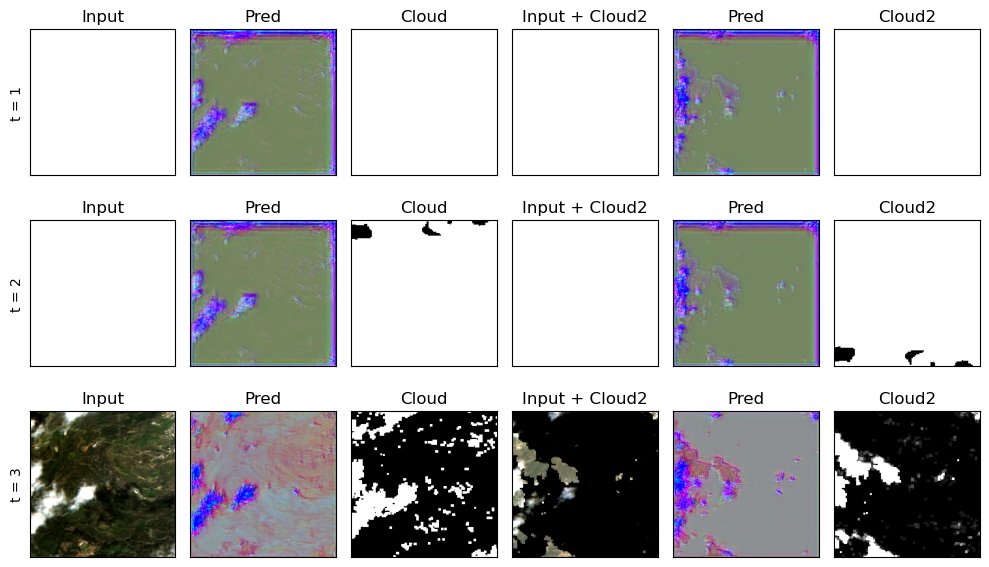

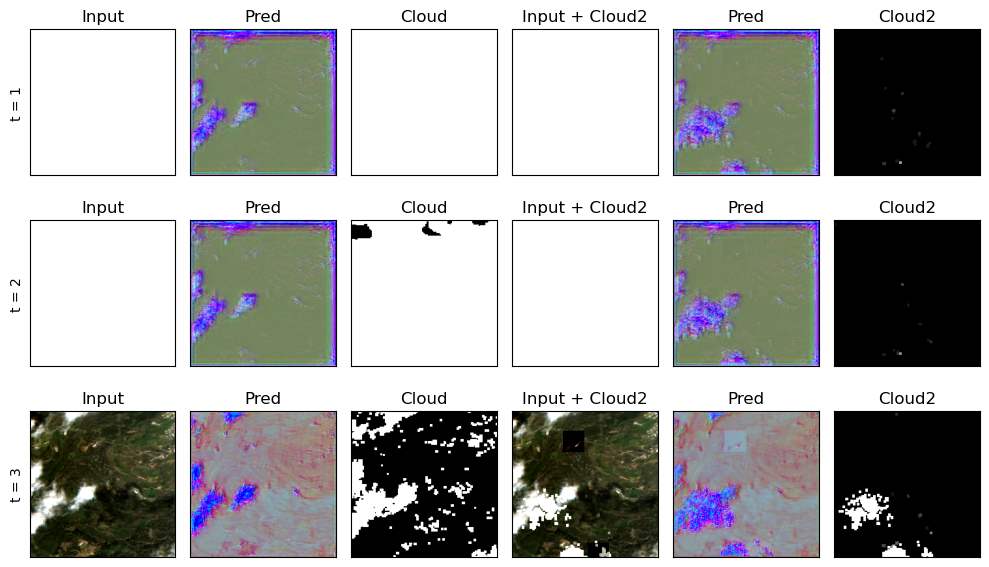

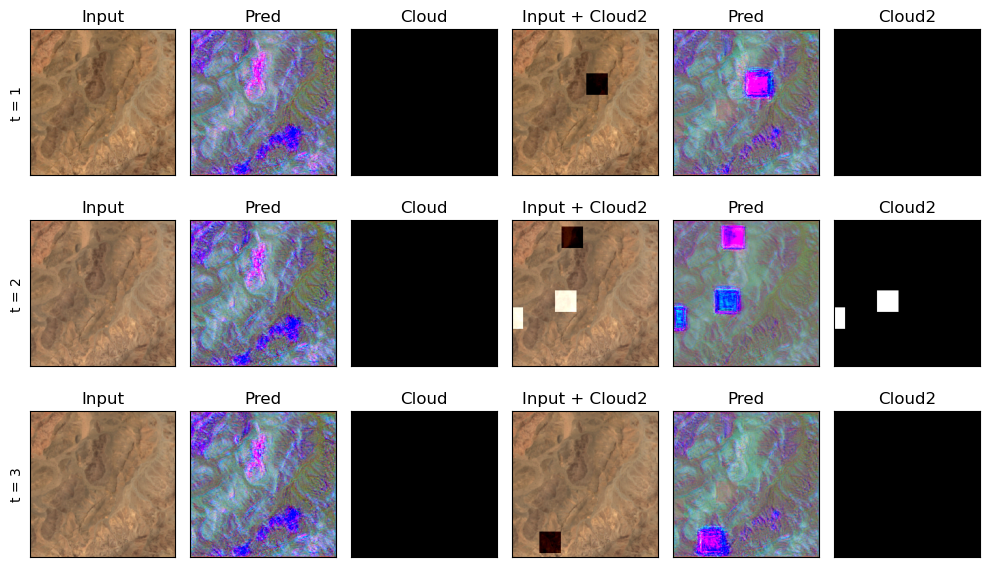

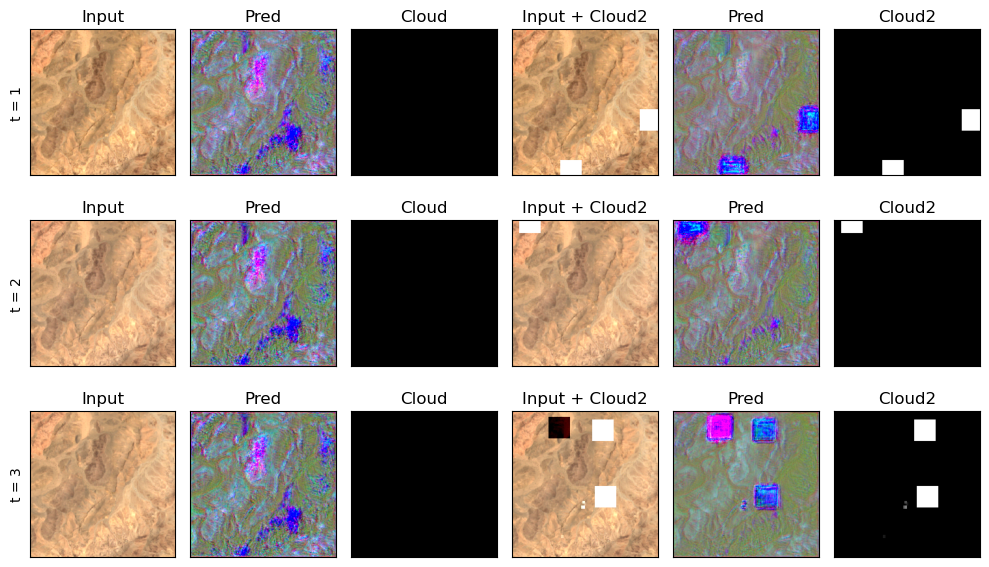

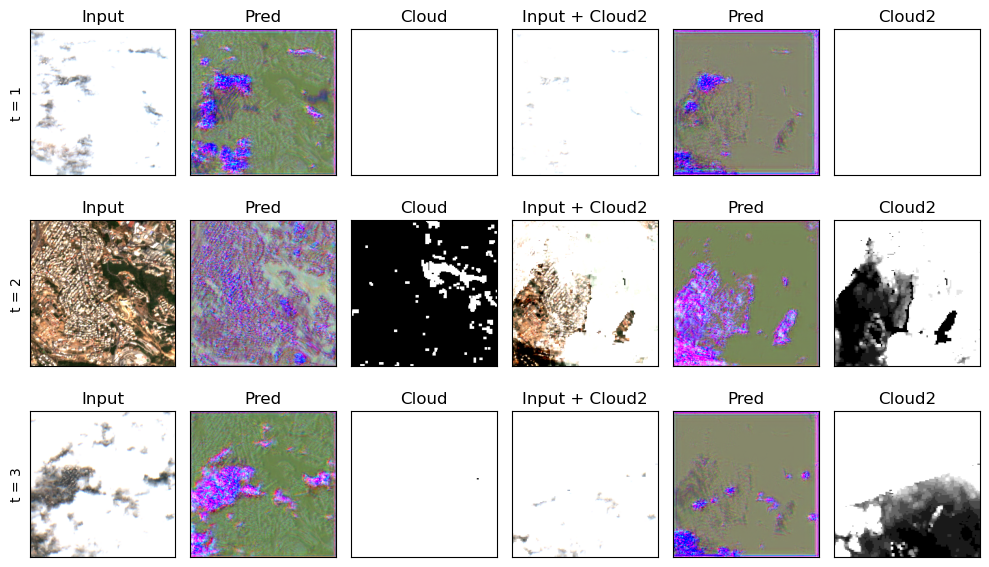

...

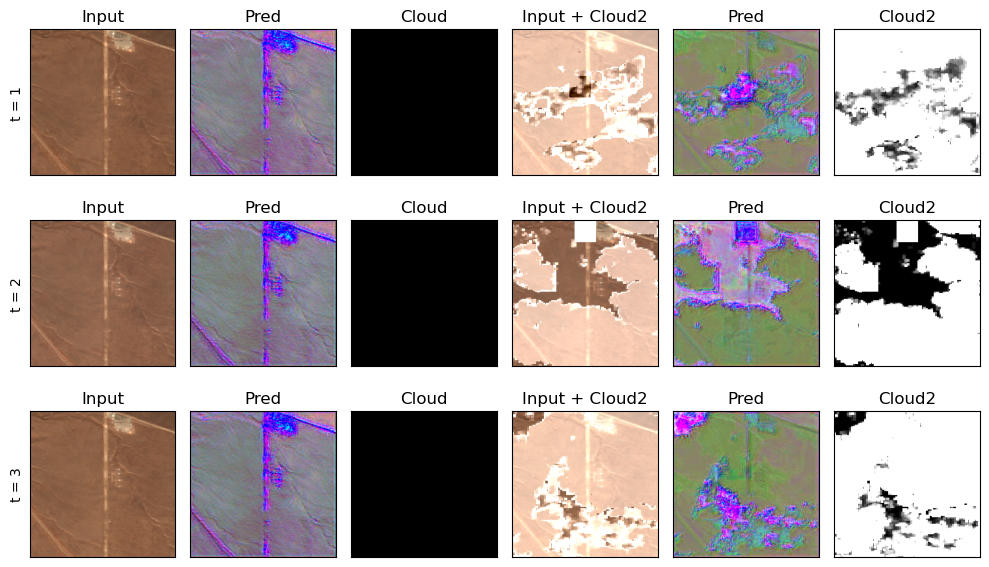

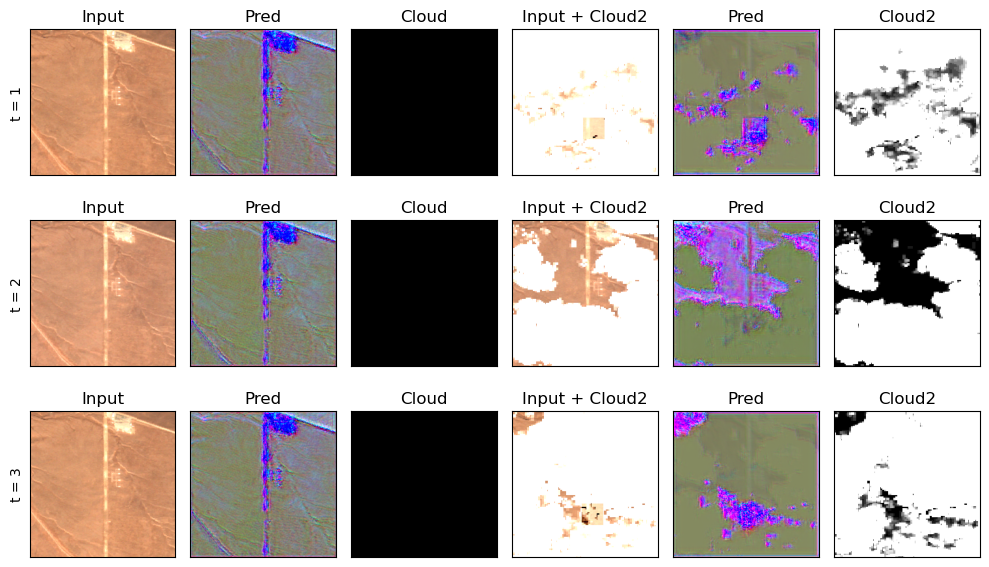

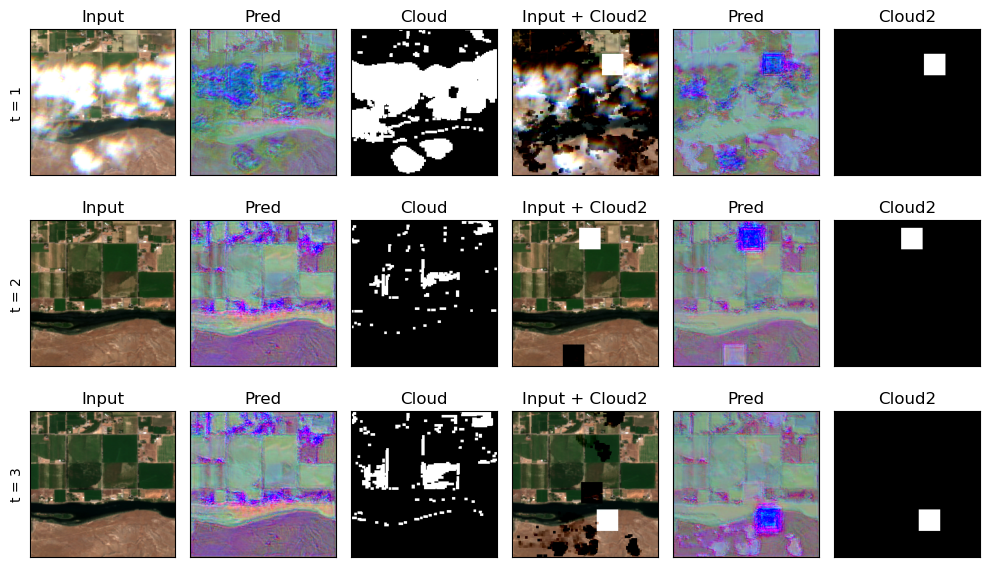

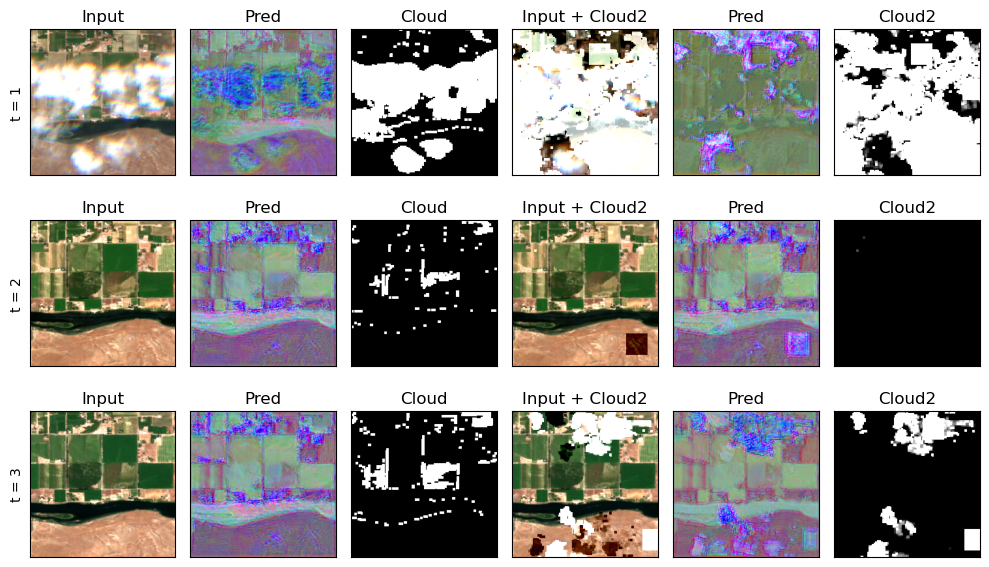

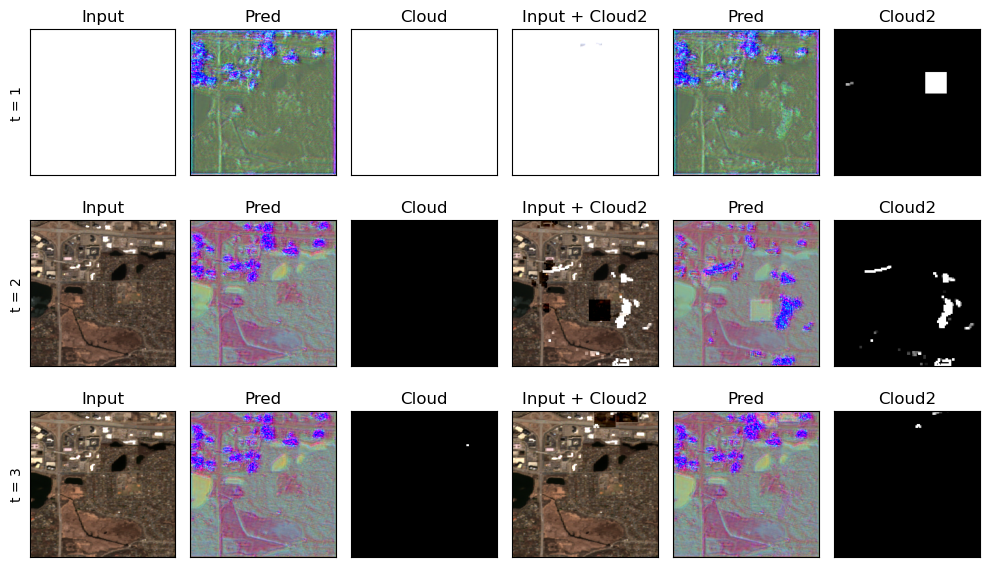

KeyboardInterrupt: 

In [7]:
# Training loop
global_step = 0
next_batch_flag = False
# Now you train the model
emb = torch.zeros((args.train_bs, 2, 1024)).to(model.device)
for args.epoch in range(args.num_epochs):

    model.train()
    progress_bar = tqdm(total=len(train_dataloader)*args.sample_reuse, disable=not accelerator.is_local_main_process, miniters=10)
    progress_bar.set_description(f"Epoch {args.epoch}")

    for args.step, (imgs_, clouds_) in enumerate(train_dataloader):
        
        if torch.sum(clouds_ > args.cld_sc) >= np.prod(clouds_.shape) * 0.66:
            print(f"Error: The cloud mask is all ones, not useful for learning. Skipping iteration {args.step}.")
            continue


        # Sanity check for input images
        if torch.isnan(imgs_).any() or torch.isinf(imgs_).any():
            print("Error: Input images contain nan or inf values. Skipping iteration.")
            continue  # Skip the current iteration and move to the next one

        if torch.isnan(clouds_).any() or torch.isinf(clouds_).any():
            print("Error: Noisy input images contain nan or inf values. Skipping iteration.")
            continue  # Skip the current iteration and move to the next one

        # Change the image dimentions from (B, T, C, H, W) to (B, C, T, H, W)
        raw_imgs = imgs_.permute(0, 2, 1, 3, 4).to(model.device)
        # Change the image dimentions from (B, T, 1, H, W) to (B, T, C, H, W) to (B, C, T, H, W)
        raw_clouds = clouds_.expand(-1,-1,3,-1,-1).permute(0, 2, 1, 3, 4).to(model.device)
        # Dilation for cloud mask so that the cloud mask is more realistic
        raw_clouds = max_dilation(raw_clouds)
        
        for args.dynamic_vmax in [0, 1]:

            # Randomly flip the images and clouds for data augmentation
            # imgs, real_clouds = random_flip(raw_imgs, raw_clouds)
            imgs, real_clouds = copy.copy(raw_imgs), copy.copy(raw_clouds)
            real_clouds_mask = (real_clouds < args.cld_sc)

            if args.dynamic_vmax == 1:
                vmax_img = torch.Tensor(np.percentile(imgs.cpu().numpy(), 98, axis=[1,3,4], keepdims=True).mean(axis=1, keepdims=True)).to(model.device).expand(-1, args.in_channel, -1, args.image_size, args.image_size)
                vmax_img = torch.minimum(vmax_img, torch.ones_like(vmax_img)*args.vmax)

            # Generate noisy images
            rand_clouds = random_cloud_generation(real_clouds)
            one_mask = generate_mask(args, args.mask_scale, args.mask_thres).to(model.device)
            rand_clouds = torch.clamp(rand_clouds, 0, args.cld_sc) / args.cld_sc
            rand_clouds = torch.clamp(rand_clouds + one_mask, 0, 1)

            rand_shadow = random_cloud_generation(real_clouds)
            one_mask = generate_mask(args, args.mask_scale, args.mask_thres).to(model.device)
            rand_shadow = torch.clamp(rand_shadow, 0, 50) / 50 
            rand_shadow = torch.clamp(rand_shadow + one_mask, 0, 1)
            noisy_imgs = imgs \
                         + rand_clouds * torch.normal(mean=args.vmax, std=torch.Tensor([args.noise_var]).to(model.device)) \
                         - rand_shadow * torch.normal(mean=args.vmax * args.CloudShadownScale , std=torch.Tensor([args.noise_var]).to(model.device))


            if args.vmax > 0:
                if args.dynamic_vmax == 1:
                    zeros_img = torch.zeros_like(vmax_img).to(model.device)
                    imgs = torch.clamp(imgs, zeros_img, vmax_img) / vmax_img
                    noisy_imgs = torch.clamp(noisy_imgs, zeros_img, vmax_img) / vmax_img
                else:
                    imgs = torch.clamp(imgs, 0, args.vmax) / args.vmax 
                    noisy_imgs = torch.clamp(noisy_imgs, 0, args.vmax) / args.vmax
                imgs = imgs * 2 - 1                                
                noisy_imgs = noisy_imgs * 2 - 1

            for args.sample_id in range(args.sample_reuse):

                if args.sample_id > 0 : break

                bs1, bs2 = args.train_bs * args.sample_id, args.train_bs * (args.sample_id+1)
                imgs_, noisy_imgs_ = imgs[bs1:bs2], noisy_imgs[bs1:bs2]
                real_clouds_, rand_clouds_ = real_clouds[bs1:bs2], rand_clouds[bs1:bs2]
                real_clouds_mask_ = real_clouds_mask[bs1:bs2]

                if accelerator.is_main_process:
                    if args.step % 1 == 0:
                        model.eval()
                        with torch.no_grad():
                            with accelerator.accumulate(model):
                                pred = model(imgs_, 1, encoder_hidden_states=emb, return_dict=False)[0]                
                                noisy_pred = model(noisy_imgs_, 1, encoder_hidden_states=emb, return_dict=False)[0]
                                visualize_batch(args, imgs_, pred, real_clouds_, noisy_imgs_, noisy_pred, rand_clouds_, mode="train")
                        model.train()

                with accelerator.accumulate(model):

                    pred = model(noisy_imgs_, 1, encoder_hidden_states=emb, return_dict=False)[0]    

                    if args.cld_mask_loss == 1:
                        loss = F.mse_loss(pred, imgs_, reduction="none") * real_clouds_mask_
                        loss = loss.mean()
                    else:
                        loss = F.mse_loss(pred, imgs_)

                    if torch.isnan(loss) or torch.isinf(loss):
                        print(f"Loss is NaN or Inf at epoch {args.epoch}, step {args.step}")
                        print(f"Loss: {loss}")
                        print(f"Img: {imgs_.min()}, {imgs_.max()}")
                        print(f"Noisy Img: {noisy_imgs_.min()}, {noisy_imgs_.max()}")
                        print(f"Noisy Pred: {pred.min()}, {pred.max()}")
                        break

                    accelerator.backward(loss)
                    optimizer.step()
                    lr_scheduler.step()
                    optimizer.zero_grad()

                progress_bar.update(1)
                logs = {"loss": loss.detach().item(), "lr": lr_scheduler.get_last_lr()[0], "step": global_step}
                progress_bar.set_postfix(**logs)
                accelerator.log(logs, step=global_step)
                global_step += 1